In [1]:
import itertools
from typing import Optional
from collections import defaultdict

import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from mpl_toolkits.axes_grid1 import ImageGrid
from torch.nn.utils.parametrizations import spectral_norm
from torch.optim import Adam
from torch.utils.data import DataLoader
from torchinfo import summary
from torchvision.datasets import EuroSAT
from torchvision.transforms.v2 import InterpolationMode, Resize
from torchvision.utils import make_grid, save_image

In [2]:
# torch.backends.fp32_precision = "tf32"
torch.set_float32_matmul_precision("high")

/home/knappa/.pyenv/versions/3.12.12/lib/python3.12/site-packages/torch/__init__.py:1617: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:80.)
  _C._set_float32_matmul_precision(precision)


# Dataset

In [8]:
# create a transform to apply to each datapoint
# imagenet_mean, imagenet_std = np.array([0.485, 0.456, 0.406]), np.array([0.229, 0.224, 0.225])
images_mean = np.array([0.5, 0.5, 0.5], dtype=np.float32)
images_std = np.array([0.5, 0.5, 0.5], dtype=np.float32)


transform = transforms.Compose(
    [
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(images_mean, images_std),
    ]
)

# download the EuroSAT datasets
path = "~/EuroSAT_DL"
train_dataset = EuroSAT(path, transform=transform, download=True)
# EuroSAT doesn't have a testing dataset?
# test_dataset = EuroSAT(path, transform=transform, download=True)

# create train and test dataloaders
batch_size = 100
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
# test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

torch.Size([100, 3, 64, 64])
-0.85882354 1.0


/tmp/ipykernel_1200173/2566019233.py:11: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  image[0][i].permute(1, 2, 0) * images_std + images_mean, a_min=0.0, a_max=1.0


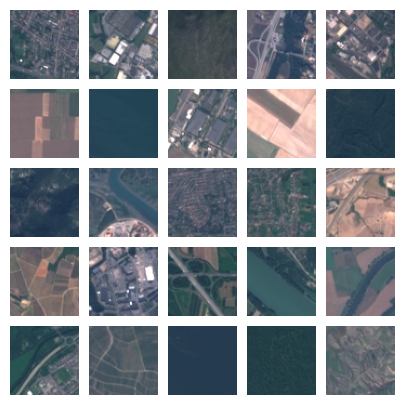

In [9]:
# get 25 sample training images for visualization
dataiter = iter(train_loader)
image = next(dataiter)

print(image[0].shape)
print(np.min(image[0].detach().cpu().numpy()), np.max(image[0].detach().cpu().numpy()))

num_samples = 25
sample_images = [
    np.clip(
        image[0][i].permute(1, 2, 0) * images_std + images_mean, a_min=0.0, a_max=1.0
    )
    for i in range(num_samples)
]

fig = plt.figure(figsize=(5, 5))
grid = ImageGrid(fig, 111, nrows_ncols=(5, 5), axes_pad=0.1)

for ax, im in zip(grid, sample_images):
    ax.imshow(im)
    ax.axis("off")

plt.show()

# PyTorch Modules

## GeomPresConv2d

In [10]:
@torch.compile
class GeomPresConv2d(nn.Module):
    def __init__(
        self,
        kernel_size: int,
        in_channels: int,
        out_channels: int,
        activation=None,
        **args
    ) -> None:
        super().__init__()

        assert kernel_size % 2 == 1
        padding = (kernel_size - 1) // 2

        self.conv = nn.Conv2d(
            in_channels=in_channels,
            out_channels=out_channels,
            kernel_size=kernel_size,
            stride=1,
            padding=padding,
            dilation=1,
            bias=True,
            padding_mode="zeros",
        )
        self.activation = activation

    def forward(self, x):
        if self.activation is None:
            return self.conv(x)
        else:
            return self.activation(self.conv(x))

## Residual

In [11]:
@torch.compile
class Residual(nn.Module):
    def __init__(
        self, activation, dimension, latent_dimension: Optional[int] = None, **args
    ) -> None:
        super().__init__()

        if latent_dimension is None:
            latent_dimension = max(1, dimension // 4)

        self.activation = activation
        self.linear1 = nn.Linear(dimension, latent_dimension, bias=True)
        self.linear2 = nn.Linear(latent_dimension, dimension, bias=True)

    def forward(self, x):
        y = self.activation(self.linear1(x))
        return self.activation(x + self.linear2(y))

## ResConv2d

In [12]:
@torch.compile
class ResConv2d(nn.Module):
    def __init__(
        self,
        activation,
        channels,
        kernel_size=3,
        latent_channels: Optional[int] = None,
        **args
    ) -> None:
        super().__init__()

        assert kernel_size % 2 == 1
        padding = (kernel_size - 1) // 2

        if latent_channels is None:
            latent_channels = channels

        self.activation = activation
        self.conv1 = nn.Conv2d(
            in_channels=channels,
            out_channels=latent_channels,
            kernel_size=kernel_size,
            stride=1,
            padding=padding,
            dilation=1,
            bias=True,
            padding_mode="zeros",
        )
        self.conv2 = nn.Conv2d(
            in_channels=latent_channels,
            out_channels=channels,
            kernel_size=kernel_size,
            stride=1,
            padding=padding,
            dilation=1,
            bias=True,
            padding_mode="zeros",
        )

    def forward(self, x):
        return x + self.conv2(self.activation(self.conv1(x)))

## Bottleneck2d

In [13]:
@torch.compile
class Bottleneck2d(nn.Module):
    def __init__(self, activation, channels, **args) -> None:
        super().__init__()

        latent_channels = max(1, channels // 4)

        self.activation = activation
        self.reduction = nn.Conv2d(
            in_channels=channels,
            out_channels=latent_channels,
            kernel_size=1,
            stride=1,
            padding=0,
            dilation=1,
            bias=True,
            padding_mode="zeros",
        )
        self.conv = nn.Conv2d(
            in_channels=latent_channels,
            out_channels=latent_channels,
            kernel_size=3,
            stride=1,
            padding=1,
            dilation=1,
            bias=True,
            padding_mode="zeros",
        )
        self.boost = nn.Conv2d(
            in_channels=latent_channels,
            out_channels=channels,
            kernel_size=1,
            stride=1,
            padding=0,
            dilation=1,
            bias=True,
            padding_mode="zeros",
        )

    def forward(self, x):
        y = self.activation(self.reduction(x))
        z = self.activation(self.conv(y))
        return self.activation(x + self.boost(z))

## ResNetEncoder

In [14]:
@torch.compile
class ResNetEncoder(nn.Module):
    def __init__(
        self,
        # hidden_dims=[1024, 512, 256, 128],
        output_dim: int,
        device=device,
        residuals_active=True,
        use_spectral_norm=False,
        final_activation=False,
        **args
    ) -> None:
        super().__init__()
        self.residuals_active = residuals_active

        # (3,64,64) -> (8,64,64)
        self.layer1 = GeomPresConv2d(
            kernel_size=7,
            in_channels=3,
            out_channels=64,
            activation=nn.LeakyReLU(inplace=True),
            device=device,
        )

        self.res_layer1 = nn.Sequential(
            Bottleneck2d(activation=nn.LeakyReLU(inplace=True), channels=64),
            Bottleneck2d(activation=nn.LeakyReLU(inplace=True), channels=64),
        ).to(device)

        self.layer1_out = nn.Sequential(
            nn.BatchNorm2d(64, eps=1e-2),
            nn.Dropout(p=0.1),
        ).to(device)

        # (64,64,64) -> (128,32,32)
        self.layer2 = nn.Sequential(
            nn.Conv2d(
                in_channels=64,
                out_channels=128,
                kernel_size=5,
                stride=2,
                padding=2,
                dilation=1,
                bias=True,
                padding_mode="zeros",
            ),
            nn.LeakyReLU(inplace=True),
        ).to(device)

        self.res_layer2 = nn.Sequential(
            Bottleneck2d(activation=nn.LeakyReLU(inplace=True), channels=128),
            Bottleneck2d(activation=nn.LeakyReLU(inplace=True), channels=128),
        ).to(device)

        self.layer2_out = nn.Sequential(
            nn.BatchNorm2d(128, eps=1e-2),
            nn.Dropout(p=0.1),
        ).to(device)

        # (128,32,32) -> (258,16,16)
        self.layer3 = nn.Sequential(
            nn.Conv2d(
                in_channels=128,
                out_channels=256,
                kernel_size=5,
                stride=2,
                padding=2,
                dilation=1,
                bias=True,
                padding_mode="zeros",
            ),
            nn.LeakyReLU(inplace=True),
        ).to(device)

        self.res_layer3 = nn.Sequential(
            Bottleneck2d(activation=nn.LeakyReLU(inplace=True), channels=256),
            Bottleneck2d(activation=nn.LeakyReLU(inplace=True), channels=256),
        ).to(device)

        self.layer3_out = nn.Sequential(
            nn.BatchNorm2d(256, eps=1e-2),
            nn.Dropout(p=0.1),
        ).to(device)

        # (256,16,16) -> (512,8,8)
        self.layer4 = nn.Sequential(
            nn.Conv2d(
                in_channels=256,
                out_channels=512,
                kernel_size=5,
                stride=2,
                padding=2,
                dilation=1,
                bias=True,
                padding_mode="zeros",
            ),
            nn.LeakyReLU(inplace=True),
        ).to(device)

        self.res_layer4 = nn.Sequential(
            Bottleneck2d(activation=nn.LeakyReLU(inplace=True), channels=512),
            Bottleneck2d(activation=nn.LeakyReLU(inplace=True), channels=512),
        ).to(device)

        self.layer4_out = nn.Sequential(
            nn.BatchNorm2d(512, eps=1e-2),
            nn.Dropout(p=0.1),
        ).to(device)

        # output layer
        output = nn.Sequential(
            nn.Flatten(),
            (
                spectral_norm(nn.Linear(512 * 8 * 8, output_dim))
                if use_spectral_norm
                else nn.Linear(512 * 8 * 8, output_dim)
            ),
        )
        if final_activation:
            output.append(nn.LeakyReLU(inplace=True))
        self.output = output.to(device)

        # # transition to FC layers
        # self.to_fc = nn.Sequential(
        #     nn.Flatten(),
        #     (
        #         spectral_norm(nn.Linear(512 * 8 * 8, hidden_dims[0]))
        #         if use_spectral_norm
        #         else nn.Linear(512 * 8 * 8, hidden_dims[0])
        #     ),
        #     nn.LeakyReLU(inplace=True),
        # ).to(device)

        # # FC layers
        # self.fc_layers = nn.ModuleList(
        #     [
        #         nn.Sequential(
        #             (
        #                 spectral_norm(nn.Linear(hidden_dims[idx], hidden_dims[idx + 1]))
        #                 if use_spectral_norm
        #                 else nn.Linear(hidden_dims[idx], hidden_dims[idx + 1])
        #             ),
        #             nn.LeakyReLU(inplace=True),
        #         )
        #         for idx in range(len(hidden_dims) - 1)
        #     ]
        # ).to(device)

        # self.fc_res_layers = nn.ModuleList(
        #     [
        #         nn.Sequential(
        #             Residual(activation=nn.LeakyReLU(inplace=True), dimension=hidden_dims[idx + 1]),
        #             Residual(activation=nn.LeakyReLU(inplace=True), dimension=hidden_dims[idx + 1]),
        #         )
        #         for idx in range(len(hidden_dims) - 1)
        #     ]
        # ).to(device)

    def set_residuals_active(self, residuals_active: bool):
        self.residuals_active = residuals_active

    def non_residual_params(self):
        return itertools.chain.from_iterable(
            map(
                lambda l: l.parameters(),
                [
                    self.layer1,
                    # self.res_layer1,
                    self.layer1_out,
                    self.layer2,
                    # self.res_layer2,
                    self.layer2_out,
                    self.layer3,
                    # self.res_layer3,
                    self.layer3_out,
                    self.layer4,
                    # self.res_layer4,
                    self.layer4_out,
                    self.output,
                    # removed:
                    # self.to_fc,
                    # self.fc_layers,
                    # # self.fc_res_layers,
                ],
            )
        )

    def residual_params(self):
        return itertools.chain.from_iterable(
            map(
                lambda l: l.parameters(),
                [
                    # self.layer1,
                    self.res_layer1,
                    # self.layer1_out,
                    # self.layer2,
                    self.res_layer2,
                    # self.layer2_out,
                    # self.layer3,
                    self.res_layer3,
                    # self.layer3_out,
                    # self.layer4,
                    self.res_layer4,
                    # self.layer4_out,
                    # self.output,
                    # # removed:
                    # # self.to_fc,
                    # # self.fc_layers,
                    # self.fc_res_layers,
                ],
            )
        )

    def forward(self, x):

        # convolutional layer 1
        out = self.layer1(x)
        if self.residuals_active:
            out = self.res_layer1(out)
        out = self.layer1_out(out)

        # convolutional layer 2
        out = self.layer2(out)
        if self.residuals_active:
            out = self.res_layer2(out)
        out = self.layer2_out(out)

        # convolutional layer 3
        out = self.layer3(out)
        if self.residuals_active:
            out = self.res_layer3(out)
        out = self.layer3_out(out)

        # convolutional layer 4
        out = self.layer4(out)
        if self.residuals_active:
            out = self.res_layer4(out)
        out = self.layer4_out(out)

        return self.output(out)

        # # transition to FC layers
        # out = self.to_fc(out)

        # # FC layers
        # for layer_idx in range(len(self.fc_layers)):
        #     out = self.fc_layers[layer_idx](out)
        #     if self.residuals_active:
        #         out = self.fc_res_layers[layer_idx](out)

        # return out

## ResNetDecoder

In [15]:
@torch.compile
class ResNetDecoder(nn.Module):
    def __init__(
        self,
        latent_dim=2,
        # hidden_dims=[128, 256, 512, 1024],
        device=device,
        residuals_active=True,
        **args,
    ) -> None:
        super().__init__()
        self.residuals_active = residuals_active

        self.input = nn.Sequential(
            nn.Linear(latent_dim, 512 * 8 * 8),
            nn.LeakyReLU(inplace=True),
            nn.Unflatten(1, (512, 8, 8)),
        ).to(device)

        # self.latent_to_fc = nn.Sequential(
        #     nn.Linear(latent_dim, hidden_dims[0]),
        #     nn.LeakyReLU(inplace=True),
        # ).to(device)

        # self.fc_res_layers = nn.ModuleList(
        #     [
        #         nn.Sequential(
        #             Residual(activation=nn.LeakyReLU(inplace=True), dimension=hidden_dims[idx]),
        #             Residual(activation=nn.LeakyReLU(inplace=True), dimension=hidden_dims[idx]),
        #         )
        #         for idx in range(len(hidden_dims) - 1)
        #     ]
        # ).to(device)

        # self.fc_layers = nn.ModuleList(
        #     [
        #         nn.Sequential(
        #             nn.Linear(hidden_dims[idx], hidden_dims[idx + 1]),
        #             nn.LeakyReLU(inplace=True),
        #         )
        #         for idx in range(len(hidden_dims) - 1)
        #     ]
        # ).to(device)

        # self.to_conv = nn.Sequential(
        #     nn.Linear(hidden_dims[-1], 512 * 8 * 8),
        #     nn.LeakyReLU(inplace=True),
        #     nn.Unflatten(1, (512, 8, 8)),
        # ).to(device)

        # (512,8,8) -> (256,16,16)
        self.conv_layer1 = nn.Sequential(
            GeomPresConv2d(
                kernel_size=5,
                in_channels=512,
                out_channels=1024,
                activation=nn.LeakyReLU(inplace=True),
            ),
            nn.PixelShuffle(2),
        ).to(device)

        self.conv_res_layer1 = nn.Sequential(
            Bottleneck2d(activation=nn.LeakyReLU(inplace=True), channels=256),
            Bottleneck2d(activation=nn.LeakyReLU(inplace=True), channels=256),
        ).to(device)

        self.conv_layer1_out = nn.Sequential(
            nn.BatchNorm2d(256, eps=1e-2),
            nn.Dropout(p=0.1),
        ).to(device)

        # (256,16,16) -> (128,32,32)
        self.conv_layer2 = nn.Sequential(
            GeomPresConv2d(
                kernel_size=5,
                in_channels=256,
                out_channels=512,
                activation=nn.LeakyReLU(inplace=True),
            ),
            nn.PixelShuffle(2),
        ).to(device)

        self.conv_res_layer2 = nn.Sequential(
            Bottleneck2d(activation=nn.LeakyReLU(inplace=True), channels=128),
            Bottleneck2d(activation=nn.LeakyReLU(inplace=True), channels=128),
            Bottleneck2d(activation=nn.LeakyReLU(inplace=True), channels=128),
        ).to(device)

        self.conv_layer2_out = nn.Sequential(
            nn.BatchNorm2d(128, eps=1e-2),
            nn.Dropout(p=0.1),
        ).to(device)

        # (128,32,32) -> (64,64,64)
        self.conv_layer3 = nn.Sequential(
            GeomPresConv2d(
                kernel_size=5,
                in_channels=128,
                out_channels=256,
                activation=nn.LeakyReLU(inplace=True),
            ),
            GeomPresConv2d(
                kernel_size=5,
                in_channels=256,
                out_channels=256,
                activation=nn.LeakyReLU(inplace=True),
            ),
            GeomPresConv2d(
                kernel_size=5,
                in_channels=256,
                out_channels=256,
                activation=nn.LeakyReLU(inplace=True),
            ),
            nn.PixelShuffle(2),
        )

        self.conv_res_layer3 = nn.Sequential(
            Bottleneck2d(activation=nn.LeakyReLU(inplace=True), channels=64),
            Bottleneck2d(activation=nn.LeakyReLU(inplace=True), channels=64),
            Bottleneck2d(activation=nn.LeakyReLU(inplace=True), channels=64),
        ).to(device)

        self.conv_layer3_out = nn.Sequential(
            nn.BatchNorm2d(64, eps=1e-2),
            nn.Dropout(p=0.1),
        )

        self.output_layer = nn.Sequential(
            GeomPresConv2d(
                kernel_size=7,
                in_channels=64,
                out_channels=64,
                activation=nn.LeakyReLU(inplace=True),
            ),
            GeomPresConv2d(
                kernel_size=7,
                in_channels=64,
                out_channels=64,
                activation=nn.LeakyReLU(inplace=True),
            ),
            GeomPresConv2d(
                kernel_size=7,
                in_channels=64,
                out_channels=3,
                activation=nn.LeakyReLU(inplace=True),
            ),
            GeomPresConv2d(
                kernel_size=3, in_channels=3, out_channels=3, activation=nn.Tanh()
            ),
        ).to(device)

    def set_residuals_active(self, residuals_active: bool):
        self.residuals_active = residuals_active

    def non_residual_params(self):
        return itertools.chain.from_iterable(
            map(
                lambda l: l.parameters(),
                [
                    self.input,
                    # removed:
                    # self.latent_to_fc,
                    # # self.fc_res_layers,
                    # self.fc_layers,
                    # self.to_conv,
                    self.conv_layer1,
                    # self.conv_res_layer1,
                    self.conv_layer1_out,
                    self.conv_layer2,
                    # self.conv_res_layer2,
                    self.conv_layer2_out,
                    self.conv_layer3,
                    # self.conv_res_layer3,
                    self.conv_layer3_out,
                    self.output_layer,
                ],
            )
        )

    def residual_params(self):
        return itertools.chain.from_iterable(
            map(
                lambda l: l.parameters(),
                [
                    # self.input,
                    # removed:
                    # # self.latent_to_fc,
                    # self.fc_res_layers,
                    # # self.fc_layers,
                    # # self.to_conv,
                    # self.conv_layer1,
                    self.conv_res_layer1,
                    # self.conv_layer1_out,
                    # self.conv_layer2,
                    self.conv_res_layer2,
                    # self.conv_layer2_out,
                    # self.conv_layer3,
                    self.conv_res_layer3,
                    # self.conv_layer3_out,
                    # self.output_layer,
                ],
            )
        )

    def forward(self, z):

        out = self.input(z)

        # out = self.latent_to_fc(z)

        # # FC layers
        # for layer_idx in range(len(self.fc_layers)):
        #     if self.residuals_active:
        #         out = self.fc_res_layers[layer_idx](out)
        #     out = self.fc_layers[layer_idx](out)

        # # transition to convolutional nets
        # out = self.to_conv(out)

        # (512,8,8) -> (256,16,16)
        out = self.conv_layer1(out)
        if self.residuals_active:
            out = self.conv_res_layer1(out)
        out = self.conv_layer1_out(out)

        # (256,16,16) -> (128,32,32)
        out = self.conv_layer2(out)
        if self.residuals_active:
            out = self.conv_res_layer2(out)
        out = self.conv_layer2_out(out)

        # (128,32,32) -> (64,64,64)
        out = self.conv_layer3(out)
        if self.residuals_active:
            out = self.conv_res_layer3(out)
        out = self.conv_layer3_out(out)

        # output layer (64,64,64) -> (3,64,64)
        out = self.output_layer(out)

        return out

## ResNetDiscriminator

In [16]:
@torch.compile
class ResNetDiscriminator(nn.Module):
    def __init__(
        self,
        n_classes=1,
        device=device,
        residuals_active=True,
        use_spectral_norm=False,
        **args
    ) -> None:
        super().__init__()
        self.residuals_active = residuals_active

        self.encoder = ResNetEncoder(
            output_dim=n_classes + 1,
            # hidden_dims=hidden_dims,
            residuals_active=residuals_active,
            use_spectral_norm=use_spectral_norm,
            device=device,
        )

    def set_residuals_active(self, residuals_active: bool):
        self.residuals_active = residuals_active
        self.encoder.set_residuals_active(residuals_active)

    def non_residual_params(self):
        return self.encoder.non_residual_params()
        # return itertools.chain(self.encoder.non_residual_params(), self.output.parameters())

    def residual_params(self):
        return self.encoder.residual_params()

    def forward(self, x):
        return self.encoder(x)

    def reduced_classifier(self, x):
        out = self.encoder(x)
        return torch.cat(
            (torch.sum(out[:, :-1], axis=1, keepdim=True), out[:, -1:]),
            axis=1,
        )

## VAEGAN

In [17]:
@torch.compile
class VAEGAN(nn.Module):

    def __init__(
        self,
        # hidden_dims=[1024, 512, 256, 128],
        encoder_dim=512,
        latent_dim=2,
        n_classes=1,
        residuals_active=False,
        device=device,
    ):
        super(VAEGAN, self).__init__()

        # self.hidden_dims = hidden_dims
        self.latent_dim = latent_dim
        self.n_classes = n_classes
        self.residuals_active = residuals_active
        self.device = device

        # encoder
        self.encoder = ResNetEncoder(
            output_dim=encoder_dim,
            # hidden_dims=hidden_dims,
            residuals_active=residuals_active,
            device=device,
            final_activation=True,
        )

        # latent mean and Cholesky decomp of covariance
        self.mean_layer = nn.Sequential(
            nn.Linear(encoder_dim, encoder_dim),
            nn.LeakyReLU(inplace=True),
            nn.BatchNorm1d(encoder_dim, eps=1e-2),
            nn.Linear(encoder_dim, latent_dim),
        ).to(device)
        self.log_var_layer = nn.Sequential(
            nn.Linear(encoder_dim, encoder_dim),
            nn.LeakyReLU(inplace=True),
            nn.BatchNorm1d(encoder_dim, eps=1e-2),
            nn.Linear(encoder_dim, latent_dim),
        ).to(device)

        # decoder
        self.decoder = ResNetDecoder(
            latent_dim=latent_dim,
            residuals_active=residuals_active,
            device=device,
        )

        # discriminator
        self.discriminator = ResNetDiscriminator(
            latent_dim=latent_dim,
            n_classes=n_classes,
            residuals_active=residuals_active,
            use_spectral_norm=True,
            device=device,
        )

    def set_residuals_active(self, residuals_active: bool):
        self.residuals_active = residuals_active
        self.encoder.set_residuals_active(residuals_active)
        self.decoder.set_residuals_active(residuals_active)
        self.discriminator.set_residuals_active(residuals_active)

    def encode(self, x):
        x = self.encoder(x)
        # mean, chol = self.mean_layer(x), self.chol_layer(x)
        # return mean, chol
        mean, log_var = self.mean_layer(x), self.log_var_layer(x)
        return mean, log_var

    def reparameterization(self, mean, log_var):
        epsilon = torch.randn_like(mean, device=self.device)
        z = mean + epsilon * torch.exp(log_var)
        return z

    def decode(self, x):
        return self.decoder(x)

    def vae_forward(self, x):
        mean, log_var = self.encode(x)
        z = self.reparameterization(mean, log_var)
        x_hat = self.decode(z)
        return x_hat, mean, log_var

    def forward(self, x):
        mean, log_var = self.encode(x)
        z = self.reparameterization(mean, log_var)
        x_hat = self.decode(z)
        c_hat = self.discriminator(x_hat)
        return c_hat, x_hat, mean, log_var

# Training

## model initialization

In [18]:
# setting 1 class distinguishes between examples and non-examples,
# we can also explore making more refined distinctions between classes

latent_dim = 128

model = VAEGAN(
    latent_dim=latent_dim,
    # hidden_dims=[1024],
    residuals_active=False,
    n_classes=1,
).to(device)

In [19]:
# load saved model weights
if False:
    saved_model_state_dict = torch.load(
        "model_state_dict_conv-vae-gan-eurosat.pth", map_location=device
    )
    model.load_state_dict(saved_model_state_dict)

## Tally the layers

In [20]:
summary(
    model.encoder,
    input_size=(100, 3, 64, 64),
    col_names=[
        "input_size",
        "output_size",
        "num_params",
        # "params_percent",
        "kernel_size",
        # "groups",
        # "mult_adds",
        # "trainable",
    ],
    col_width=17,
)

W1118 15:07:13.773000 1200173 site-packages/torch/_dynamo/convert_frame.py:1358] [6/8] torch._dynamo hit config.recompile_limit (8)
W1118 15:07:13.773000 1200173 site-packages/torch/_dynamo/convert_frame.py:1358] [6/8]    function: 'hook' (/home/knappa/.pyenv/versions/3.12.12/lib/python3.12/site-packages/torchinfo/torchinfo.py:592)
W1118 15:07:13.773000 1200173 site-packages/torch/_dynamo/convert_frame.py:1358] [6/8]    last reason: 6/7: global_layer_info[139666225687456].macs == 0             # self.macs += prod(self.output_size[:2]) * cur_params  # torchinfo/layer_info.py:245 in calculate_macs
W1118 15:07:13.773000 1200173 site-packages/torch/_dynamo/convert_frame.py:1358] [6/8] To log all recompilation reasons, use TORCH_LOGS="recompiles".
W1118 15:07:13.773000 1200173 site-packages/torch/_dynamo/convert_frame.py:1358] [6/8] To diagnose recompilation issues, see https://pytorch.org/docs/main/torch.compiler_troubleshooting.html


Layer (type:depth-idx)                   Input Shape       Output Shape      Param #           Kernel Shape
ResNetEncoder                            [100, 3, 64, 64]  [100, 512]        742,720           --
├─GeomPresConv2d: 1-1                    [100, 3, 64, 64]  [100, 64, 64, 64] --                --
│    └─Conv2d: 2-1                       [100, 3, 64, 64]  [100, 64, 64, 64] 9,472             [7, 7]
│    └─LeakyReLU: 2-2                    [100, 64, 64, 64] [100, 64, 64, 64] --                --
├─Sequential: 1-2                        [100, 64, 64, 64] [100, 64, 64, 64] --                --
│    └─BatchNorm2d: 2-3                  [100, 64, 64, 64] [100, 64, 64, 64] 128               --
│    └─Dropout: 2-4                      [100, 64, 64, 64] [100, 64, 64, 64] --                --
├─Sequential: 1-3                        [100, 64, 64, 64] [100, 128, 32, 32] --                --
│    └─Conv2d: 2-5                       [100, 64, 64, 64] [100, 128, 32, 32] 204,928           [5, 5]


In [21]:
summary(
    model.decoder,
    input_size=(
        100,
        latent_dim,
    ),
    col_names=[
        "input_size",
        "output_size",
        "num_params",
        # "params_percent",
        "kernel_size",
        # "groups",
        # "mult_adds",
        # "trainable",
    ],
    col_width=17,
)

W1118 15:07:14.924000 1200173 site-packages/torch/_dynamo/convert_frame.py:1358] [7/8] torch._dynamo hit config.recompile_limit (8)
W1118 15:07:14.924000 1200173 site-packages/torch/_dynamo/convert_frame.py:1358] [7/8]    function: 'torch_dynamo_resume_in_forward_at_32' (/tmp/ipykernel_1200173/3214759084.py:32)
W1118 15:07:14.924000 1200173 site-packages/torch/_dynamo/convert_frame.py:1358] [7/8]    last reason: 7/7: ___check_obj_id(___stack0, 139665974875904)              # self.layer_id = id(module)  # torchinfo/layer_info.py:37 in __init__
W1118 15:07:14.924000 1200173 site-packages/torch/_dynamo/convert_frame.py:1358] [7/8] To log all recompilation reasons, use TORCH_LOGS="recompiles".
W1118 15:07:14.924000 1200173 site-packages/torch/_dynamo/convert_frame.py:1358] [7/8] To diagnose recompilation issues, see https://pytorch.org/docs/main/torch.compiler_troubleshooting.html


Layer (type:depth-idx)                   Input Shape       Output Shape      Param #           Kernel Shape
ResNetDecoder                            [100, 128]        [100, 3, 64, 64]  206,176           --
├─Sequential: 1-1                        [100, 128]        [100, 512, 8, 8]  --                --
│    └─Linear: 2-1                       [100, 128]        [100, 32768]      4,227,072         --
│    └─LeakyReLU: 2-2                    [100, 32768]      [100, 32768]      --                --
│    └─Unflatten: 2-3                    [100, 32768]      [100, 512, 8, 8]  --                --
├─Sequential: 1-2                        [100, 512, 8, 8]  [100, 256, 16, 16] --                --
│    └─GeomPresConv2d: 2-4               [100, 512, 8, 8]  [100, 1024, 8, 8] --                --
│    │    └─Conv2d: 3-1                  [100, 512, 8, 8]  [100, 1024, 8, 8] 13,108,224        [5, 5]
│    │    └─LeakyReLU: 3-2               [100, 1024, 8, 8] [100, 1024, 8, 8] --                --
│    

In [22]:
summary(
    model.discriminator,
    input_size=(100, 3, 64, 64),
    col_names=[
        "input_size",
        "output_size",
        "num_params",
        # "params_percent",
        "kernel_size",
        # "groups",
        # "mult_adds",
        # "trainable",
    ],
    col_width=17,
)

Layer (type:depth-idx)                             Input Shape       Output Shape      Param #           Kernel Shape
ResNetDiscriminator                                [100, 3, 64, 64]  [100, 2]          --                --
├─ResNetEncoder: 1-1                               [100, 3, 64, 64]  [100, 2]          742,720           --
│    └─GeomPresConv2d: 2-1                         [100, 3, 64, 64]  [100, 64, 64, 64] --                --
│    │    └─Conv2d: 3-1                            [100, 3, 64, 64]  [100, 64, 64, 64] 9,472             [7, 7]
│    │    └─LeakyReLU: 3-2                         [100, 64, 64, 64] [100, 64, 64, 64] --                --
│    └─Sequential: 2-2                             [100, 64, 64, 64] [100, 64, 64, 64] --                --
│    │    └─BatchNorm2d: 3-3                       [100, 64, 64, 64] [100, 64, 64, 64] 128               --
│    │    └─Dropout: 3-4                           [100, 64, 64, 64] [100, 64, 64, 64] --                --
│    └─Sequent

## Loss functions

In [23]:
def vae_loss_function(x, x_hat, mean, log_var):
    # reproduction_loss = torch.nn.functional.mse_loss(input=x_hat, target=x, reduction="sum")
    reproduction_loss = 0.5 * (
        torch.nn.functional.l1_loss(input=x_hat, target=x, reduction="sum")
        + torch.nn.functional.mse_loss(input=x_hat, target=x, reduction="sum")
    )
    # reproduction_loss = torch.nn.functional.binary_cross_entropy_with_logits(input=x_hat, target=x, reduction="sum")

    KLD = torch.mean(
        torch.clip(
            0.5
            * (
                torch.sum(mean.pow(2), axis=1)
                + torch.sum(torch.exp(log_var) - log_var, axis=1)
                - model.latent_dim
            ),
            -float("inf"),
            1e3,
        )
    )

    # print(f"{torch.max(reproduction_loss)=}, {torch.min(reproduction_loss)=}")
    # print(f"{torch.max(KLD)=}, {torch.min(KLD)=}")

    # l1_param_norm = sum(p.abs().sum() for p in model.parameters())

    return reproduction_loss, KLD  # , l1_param_norm

In [24]:
# for training the VAE portion (not the discriminator)
def vaegan_loss_function(true_c, c_hat, x, x_hat, mean, chol):
    vae_repro_loss, vae_kld_loss = vae_loss_function(x, x_hat, mean, chol)

    if model.n_classes == 1:
        gan_true_loss = nn.functional.cross_entropy(
            input=c_hat, target=torch.zeros_like(true_c), reduction="sum"
        )
    else:
        gan_true_loss = nn.functional.cross_entropy(
            input=c_hat, target=true_c, reduction="sum"
        )

    return vae_repro_loss, vae_kld_loss, gan_true_loss

## Optimizers

In [108]:
lr = 1e-5 # 1e-4
weight_decay = 1e-6

vae_optimizer = Adam(
    itertools.chain(
        model.encoder.parameters(),
        model.mean_layer.parameters(),
        model.log_var_layer.parameters(),
        model.decoder.parameters(),
    ),
    lr=lr,
    weight_decay=1e-6,
)

vae_optimizer_non_res = Adam(
    itertools.chain(
        model.encoder.non_residual_params(),
        model.mean_layer.parameters(),
        model.log_var_layer.parameters(),
        model.decoder.non_residual_params(),
    ),
    lr=lr,
    weight_decay=1e-6,
)

disc_optimizer = Adam(model.discriminator.parameters(), lr=lr, weight_decay=1e-6)

disc_optimizer_non_res = Adam(
    model.discriminator.non_residual_params(), lr=lr, weight_decay=1e-6
)

## Training

In [109]:
def train(model, vae_optimizer, disc_optimizer, epochs, device, train_gan=False):
    model.train()
    for epoch in range(epochs):
        overall_loss = 0
        vae_loss = 0
        vae_repro_loss = 0
        vae_kld_loss = 0
        disc_loss_data = 0
        disc_loss_fake = 0
        for batch_idx, (x, true_c) in enumerate(train_loader):
            x = x.view(batch_size, 3, 64, 64).to(device)
            true_c = true_c.view(batch_size).to(device)

            ################################################################################
            # train VAE
            vae_optimizer.zero_grad()

            c_hat, x_hat, mean, chol = model(x)
            if train_gan:
                batch_vae_repro_loss, batch_vae_kld_loss, batch_gan_true_loss = (
                    vaegan_loss_function(true_c, c_hat, x, x_hat, mean, chol)
                )
                loss = batch_vae_repro_loss + batch_vae_kld_loss + batch_gan_true_loss
            else:
                batch_vae_repro_loss, batch_vae_kld_loss = vae_loss_function(
                    x, x_hat, mean, chol
                )
                loss = batch_vae_repro_loss + batch_vae_kld_loss

            # determine overall scale of the encoding for use in generating samples of the latent space
            encoding_variance = torch.var(mean, keepdim=False).item()

            vae_loss += loss.mean().item()
            vae_repro_loss += batch_vae_repro_loss.mean().item()
            vae_kld_loss += batch_vae_kld_loss.mean().item()
            overall_loss += loss.mean().item()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(
                model.parameters(),
                1.0,
                norm_type="inf",
                error_if_nonfinite=False,
                foreach=None,
            )
            vae_optimizer.step()

            if not train_gan:
                continue

            ################################################################################
            # train discriminator on real data
            disc_optimizer.zero_grad()

            c_hat = model.discriminator(x)
            if model.n_classes == 1:
                # using zeros instead of classes so that we only make a distinction between examples and non-examples
                loss = nn.functional.cross_entropy(
                    input=c_hat,
                    target=torch.zeros_like(true_c, dtype=torch.int64, device=device),
                    reduction="sum",
                )
            else:
                loss = nn.functional.cross_entropy(
                    input=c_hat, target=true_c, reduction="sum"
                )

            disc_loss_data += loss.mean().item()
            overall_loss += loss.mean().item()

            loss.backward()
            torch.nn.utils.clip_grad_norm_(
                model.parameters(),
                1.0,
                norm_type="inf",
                error_if_nonfinite=False,
                foreach=None,
            )
            disc_optimizer.step()

            ################################################################################
            # train discriminator on fake data
            disc_optimizer.zero_grad()

            # option 1: random sampling of latent space
            noise = encoding_variance * torch.randn(
                x.shape[0], model.latent_dim, device=device
            )
            fake_data = model.decoder(noise).detach()

            # option 2: sampling of latent space using encoder
            # x_hat, mean, chol = model.vae_forward(x)
            # fake_data = x_hat.detach()

            c_hat = model.discriminator(fake_data)

            loss = nn.functional.cross_entropy(
                input=c_hat,
                target=torch.full((x.shape[0],), model.n_classes, device=device),
                reduction="sum",
            )
            disc_loss_fake += loss.mean().item()
            overall_loss += loss.mean().item()

            loss.backward()

            torch.nn.utils.clip_grad_norm_(
                model.parameters(),
                1.0,
                norm_type="inf",
                error_if_nonfinite=False,
                foreach=None,
            )
            disc_optimizer.step()

        if train_gan:
            print(f"Epoch {epoch + 1}:")
            print(
                f"   Av. Overall Loss: {overall_loss / (batch_idx * batch_size):20.4f}"
            )
            print(
                f"           VAE loss: {vae_loss / (batch_idx * batch_size):20.4f}"
                f"\tRepro loss: {vae_repro_loss / (batch_idx * batch_size):20.4f}"
                f"\tKLD loss: {vae_kld_loss / (batch_idx * batch_size):20.4f}"
            )
            print(
                f"  Disc. loss (data): {disc_loss_data / (batch_idx * batch_size):20.4f}"
            )
            print(
                f"  Disc. loss (fake): {disc_loss_fake / (batch_idx * batch_size):20.4f}"
            )
        else:
            print(f"Epoch {epoch + 1}:")
            print(
                f"  VAE loss: {vae_loss / (batch_idx * batch_size):20.4f}"
                f"\tRepro loss: {vae_repro_loss / (batch_idx * batch_size):20.4f}"
                f"\tKLD loss: {vae_kld_loss / (batch_idx * batch_size):20.4f}"
            )

    return overall_loss

### do it!

#### Without Residuals

In [27]:
model.set_residuals_active(False)

train(
    model,
    vae_optimizer_non_res,
    disc_optimizer_non_res,
    epochs=100,
    device=device,
    train_gan=False,
)

Epoch 1:
  VAE loss:            1509.4782	Repro loss:            1508.6931	KLD loss:               0.7851
Epoch 2:
  VAE loss:             986.9326	Repro loss:             985.4979	KLD loss:               1.4347
Epoch 3:
  VAE loss:             869.1734	Repro loss:             867.3538	KLD loss:               1.8195
Epoch 4:
  VAE loss:             843.1691	Repro loss:             841.0805	KLD loss:               2.0886
Epoch 5:
  VAE loss:             808.7613	Repro loss:             806.4866	KLD loss:               2.2747
Epoch 6:
  VAE loss:             781.2161	Repro loss:             778.7257	KLD loss:               2.4904
Epoch 7:
  VAE loss:             764.4504	Repro loss:             761.7673	KLD loss:               2.6830
Epoch 8:
  VAE loss:             751.0904	Repro loss:             748.2791	KLD loss:               2.8113
Epoch 9:
  VAE loss:             707.4798	Repro loss:             704.6214	KLD loss:               2.8583
Epoch 10:
  VAE loss:             690.3418	Rep

11301971.94140625

#### With Residuals

In [78]:
model.set_residuals_active(True)

train(model, vae_optimizer, disc_optimizer, epochs=100, device=device, train_gan=False)

Epoch 1:
  VAE loss:             349.9420	Repro loss:             347.4780	KLD loss:               2.4640
Epoch 2:
  VAE loss:             349.9546	Repro loss:             347.5171	KLD loss:               2.4375
Epoch 3:
  VAE loss:             347.6683	Repro loss:             345.2322	KLD loss:               2.4361
Epoch 4:
  VAE loss:             347.8329	Repro loss:             345.4006	KLD loss:               2.4323
Epoch 5:
  VAE loss:             349.4020	Repro loss:             346.9657	KLD loss:               2.4363
Epoch 6:
  VAE loss:             347.3290	Repro loss:             344.8952	KLD loss:               2.4338
Epoch 7:
  VAE loss:             345.9433	Repro loss:             343.5000	KLD loss:               2.4433
Epoch 8:
  VAE loss:             347.6308	Repro loss:             345.1995	KLD loss:               2.4314
Epoch 9:
  VAE loss:             346.4886	Repro loss:             344.0525	KLD loss:               2.4361
Epoch 10:
  VAE loss:             347.0455	Rep

8931319.623046875

#### With Res. and GAN

In [ ]:
model.set_residuals_active(True)

train(model, vae_optimizer, disc_optimizer, epochs=100, device=device, train_gan=True)

Epoch 1:
   Av. Overall Loss:             311.2730
           VAE loss:             311.2730	Repro loss:             308.8638	KLD loss:               2.4092
  Disc. loss (data):               0.0000
  Disc. loss (fake):               0.0000
Epoch 2:
   Av. Overall Loss:             311.3742
           VAE loss:             311.3742	Repro loss:             308.9689	KLD loss:               2.4053
  Disc. loss (data):               0.0000
  Disc. loss (fake):               0.0000
Epoch 3:
   Av. Overall Loss:             311.1704
           VAE loss:             311.1704	Repro loss:             308.7630	KLD loss:               2.4074
  Disc. loss (data):               0.0000
  Disc. loss (fake):               0.0000
Epoch 4:
   Av. Overall Loss:             311.4088
           VAE loss:             311.4088	Repro loss:             309.0028	KLD loss:               2.4060
  Disc. loss (data):               0.0000
  Disc. loss (fake):               0.0000
Epoch 5:
   Av. Overall Loss:       

#### Save it

In [ ]:
# torch.save(model, "model_conv-vae-gan-eurosat.pth")
torch.save(
    model.state_dict(), f"model_state_dict_conv-vae-gan-eurosat-latent-{latent_dim}.pth"
)

# Visualization

In [ ]:
def generate_example(latent_vec):
    z_sample = torch.tensor([latent_vec], dtype=torch.float, device=model.device)
    x_decoded = model.decode(z_sample)
    example = x_decoded.detach().cpu().numpy().reshape((3, 64, 64))
    plt.title(f"[{latent_vec[0]},{latent_vec[1]}]")
    plt.imshow(np.clip(example.transpose((1, 2, 0)) * images_std + images_mean, 0, 1))
    # plt.imshow(example.transpose((1, 2, 0)))
    plt.axis("off")
    plt.show()

In [ ]:
z_sample = torch.tensor(
    [[0.0, 1.0] + [0.0] * (latent_dim - 2)], dtype=torch.float, device=model.device
)
x_decoded = model.decode(z_sample)
example = x_decoded.detach().cpu().numpy().reshape((3, 64, 64))
example.transpose((1, 2, 0)) * images_std + images_mean

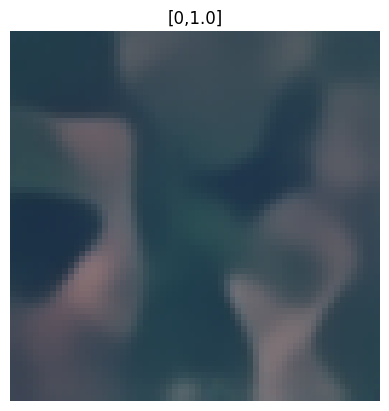

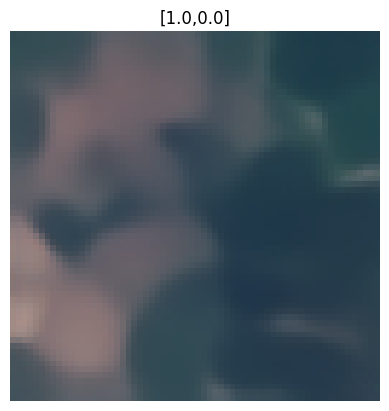

(None, None)

In [139]:
generate_example([0, 1.0] + [0.0] * (latent_dim - 2)), generate_example(
    [1.0, 0.0] + [0.0] * (latent_dim - 2)
)

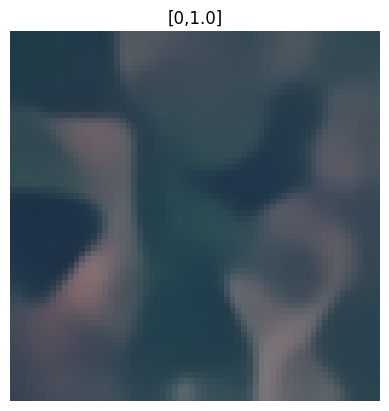

In [140]:
k = 1
generate_example(([0] * k) + [1.0] + [0.0] * (latent_dim - k - 1))

In [ ]:
for idx, (x, labels) in enumerate(train_loader):
    x = x.view(batch_size, 3, 64, 64).to(device)
    mean_reps, log_var_rep = model.encode(x)
    decoded = model.decode(mean_reps).detach().cpu().numpy().reshape((batch_size, 3, 64, 64))
    labels = labels.detach().cpu().numpy()

    for idx in range(10):
        fig, axs = plt.subplots((1,2))
        fig.set_title(f"[{labels[idx]]")
        axs[0].imshow(np.clip(x.transpose((1, 2, 0)) * images_std + images_mean, 0, 1))
        axs[0].axis("off")
        axs[1].imshow(np.clip(decoded.transpose((1, 2, 0)) * images_std + images_mean, 0, 1))
        axs[1].axis("off")
        fig.show()
    break

## Latent embedding

In [130]:
encoded_reps = defaultdict(list)

for batch_idx, (x, labels) in enumerate(train_loader):
    x = x.view(batch_size, 3, 64, 64).to(device)
    mean_reps, chol_rep = model.encode(x)
    for rep, label in zip(mean_reps, labels):
        encoded_reps[int(label)].append(rep.detach().cpu().numpy()[:2])

In [131]:
sorted(encoded_reps.keys())

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]

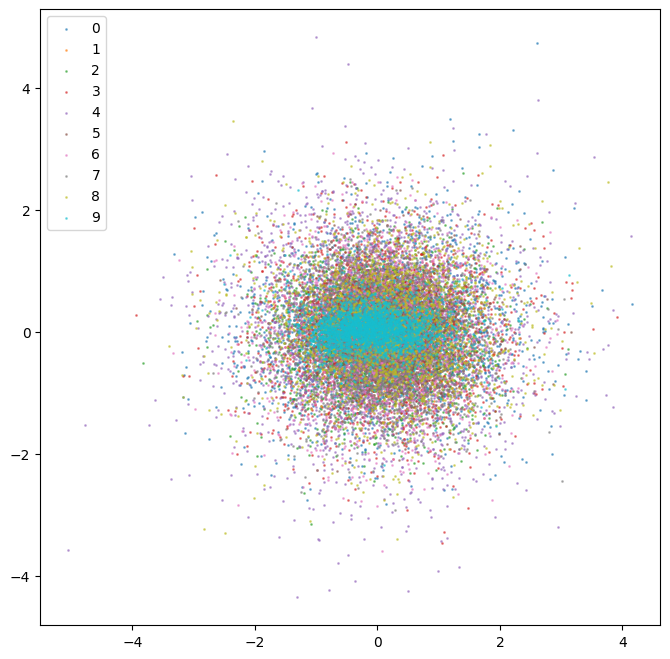

In [132]:
fig = plt.figure(figsize=(8, 8))
ax = fig.gca()
for label in range(10):
    ax.scatter(*zip(*encoded_reps[label]), s=1, label=str(label), alpha=0.5)

ax.legend()

## Generative model

In [133]:
def plot_latent_space(model, scale=5.0, n=25, example_size=64, figsize=15):
    # display a n*n 2D manifold of digits
    figure = np.zeros((3, example_size * n, example_size * n))

    # construct a grid
    grid_x = np.linspace(-scale, scale, n)
    grid_y = np.linspace(-scale, scale, n)[::-1]

    for i, yi in enumerate(grid_y):
        for j, xi in enumerate(grid_x):
            z_sample = torch.tensor(
                [[xi, yi] + [0.0] * (latent_dim - 2)],
                dtype=torch.float,
                device=model.device,
            )
            x_decoded = model.decode(z_sample)
            example = (
                x_decoded[0]
                .detach()
                .cpu()
                .reshape(3, example_size, example_size)
                .numpy()
            )
            example = example.transpose((1, 2, 0)) * images_std + images_mean
            example = example.transpose((2, 0, 1))
            example = np.clip(example, 0, 1)
            figure[
                :,
                i * example_size : (i + 1) * example_size,
                j * example_size : (j + 1) * example_size,
            ] = example

    plt.figure(figsize=(figsize, figsize))
    plt.title("VAE Latent Space Visualization")
    start_range = example_size // 2
    end_range = n * example_size + start_range
    pixel_range = np.arange(start_range, end_range, example_size)
    sample_range_x = np.round(grid_x, 1)
    sample_range_y = np.round(grid_y, 1)
    plt.xticks(pixel_range, sample_range_x)
    plt.yticks(pixel_range, sample_range_y)
    plt.xlabel("z [0]")
    plt.ylabel("z [1]")
    plt.imshow(figure.transpose((1, 2, 0)))
    plt.show()

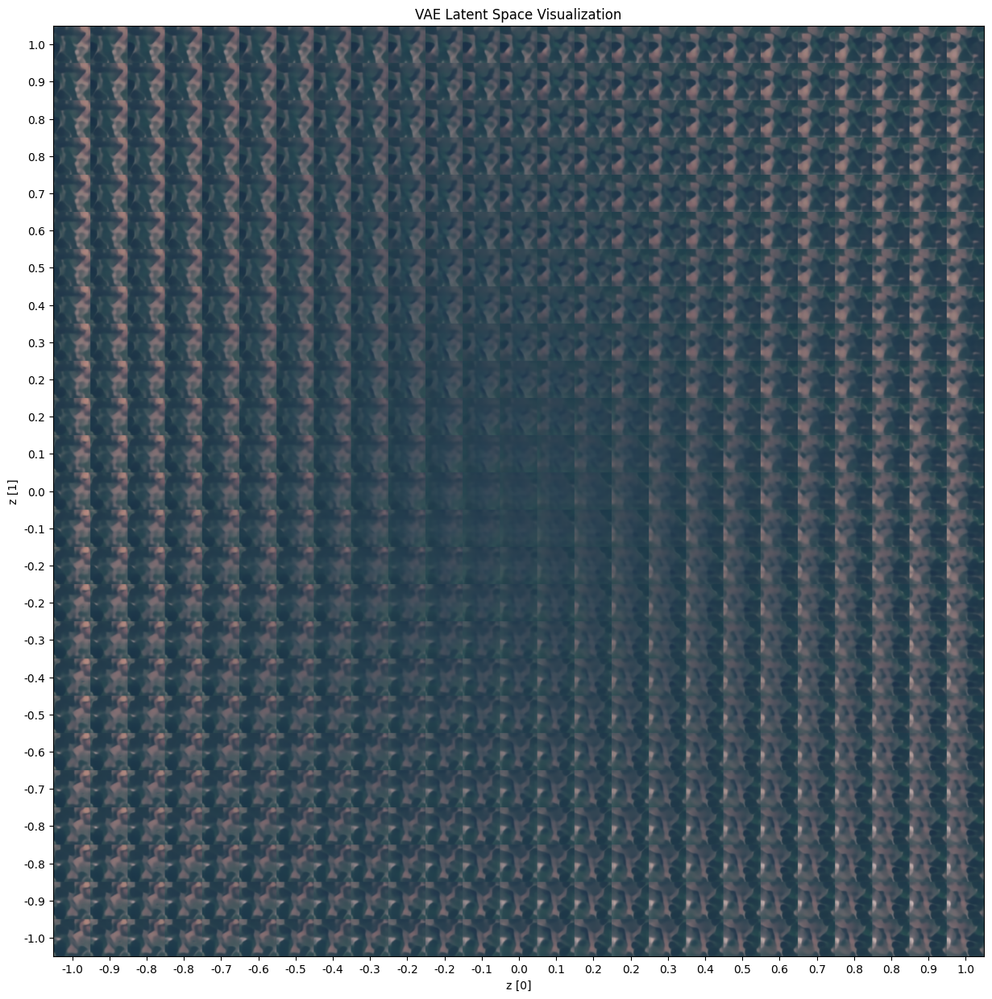

In [134]:
plot_latent_space(model, scale=1.0)

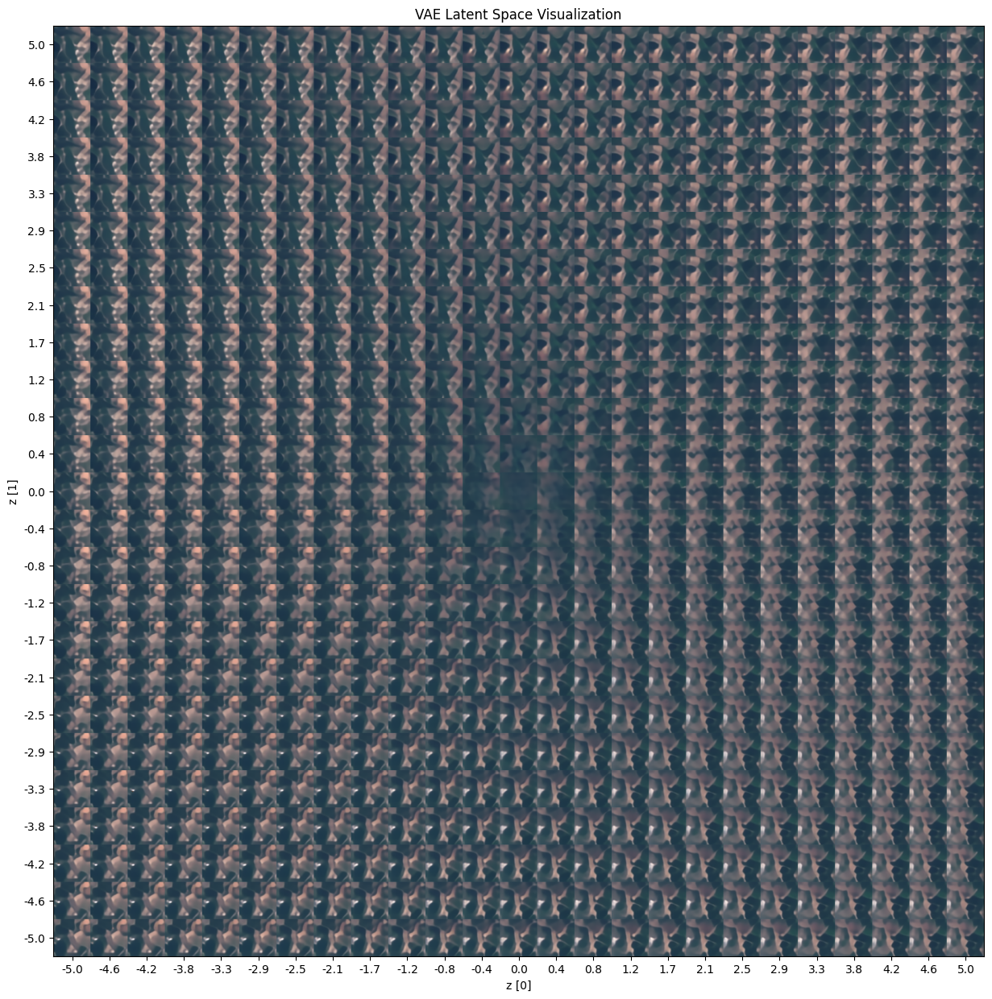

In [135]:
plot_latent_space(model, scale=5.0)

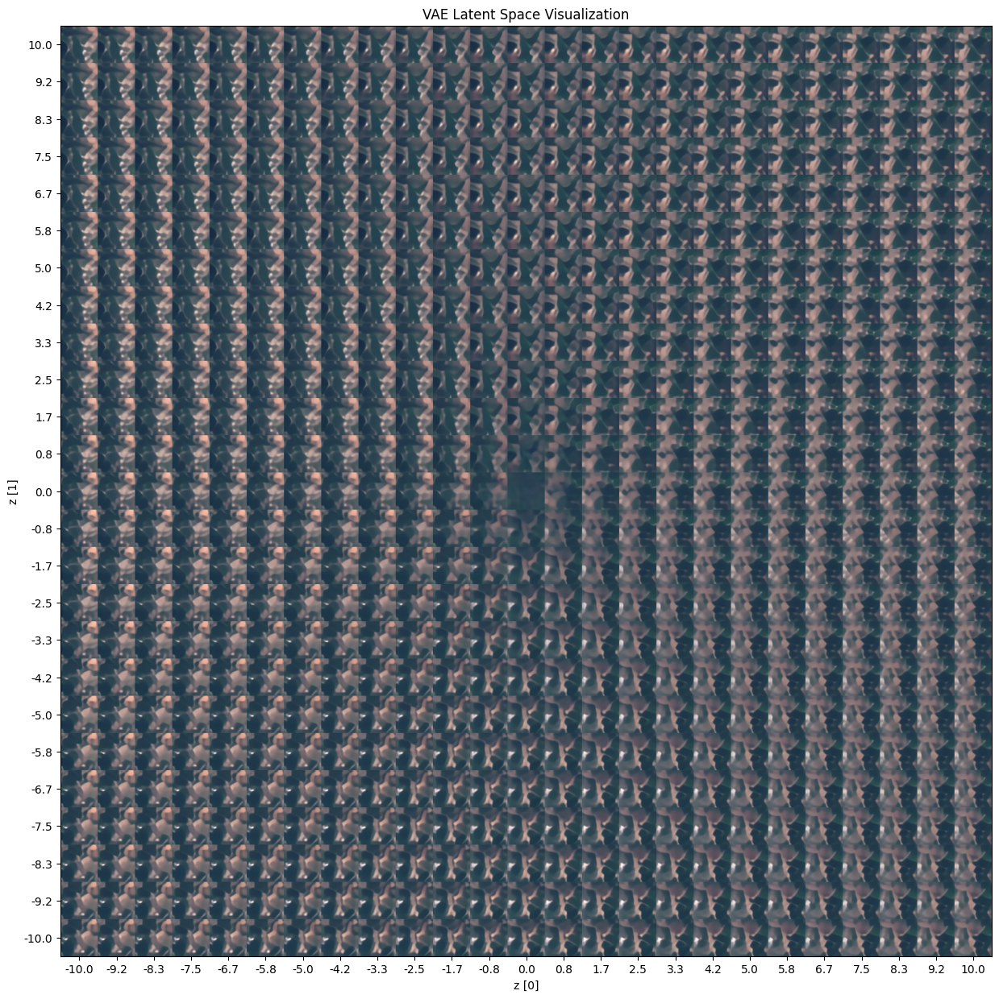

In [136]:
plot_latent_space(model, scale=10.0)

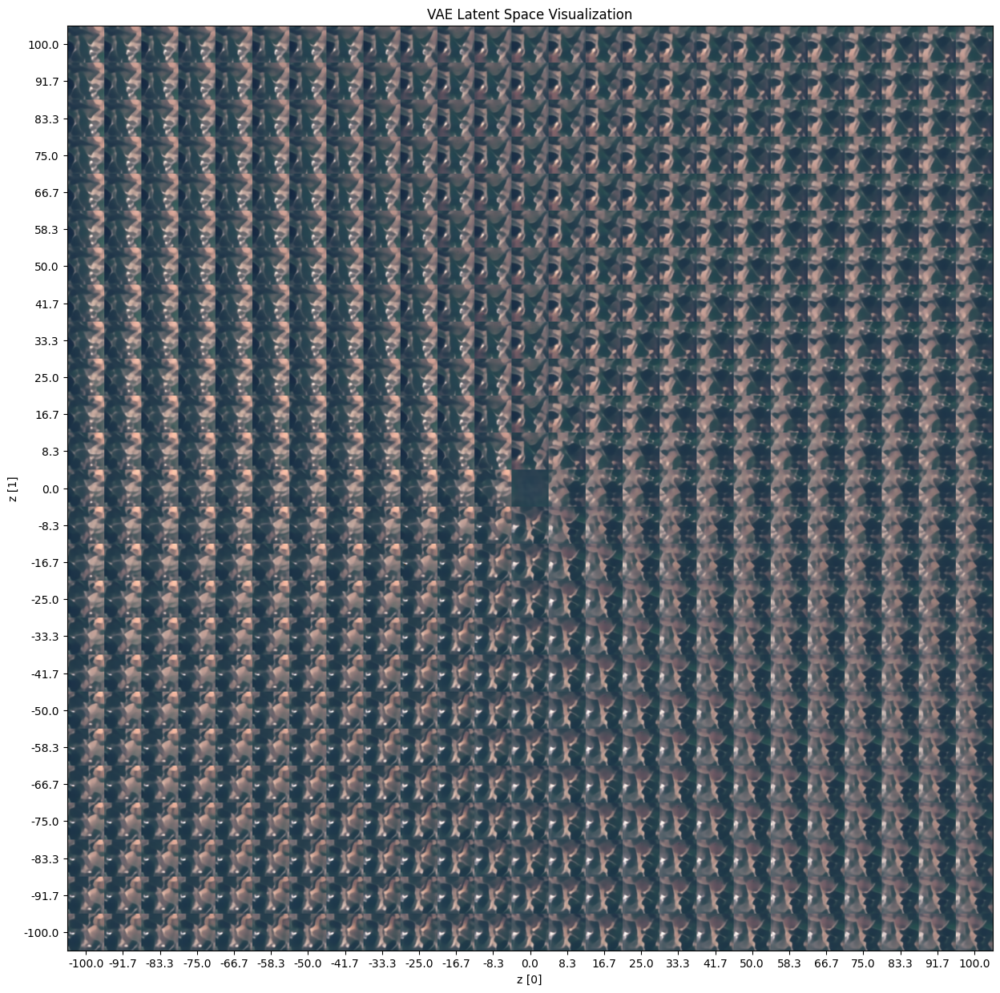

In [137]:
plot_latent_space(model, scale=100.0)